In [1]:
from PIL import Image
from skimage import measure
import numpy as np 
import pandas as pd 
import os
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches


Image_folder = 'Y:\coskun-lab\Thomas\Mayar-Data\Image'
Mask_folder = 'Y:\coskun-lab\Thomas\Mayar-Data\Mask'
Cluster_folder = 'Y:\coskun-lab\Thomas\Mayar-Data\Clusters'

%matplotlib inline

# Get density per marker

In [58]:
# Experiment
experiment = 'DT14'

markers = []
masks = []

for (dirpath, dirnames, filenames) in os.walk(Mask_folder):
    for name in filenames:
        if 'BM' in name and experiment in name:        
            img = cv2.imread(os.path.join(dirpath,name),0)
            
            markers.append(name.split('_')[-1].split('.')[0])
            masks.append(img)

# Read cell mask image 
for (dirpath, dirnames, filenames) in os.walk(Mask_folder):
    for name in filenames:
        if 'Cell_Mask' in name and experiment in name:
            cell_mask = np.array(Image.open(os.path.join(dirpath,name)))
            
# Get cell with mask
cell_masks = []
for i in range(len(masks)):
# Apply cluster mask 
    res = cv2.bitwise_and(cell_mask,cell_mask,mask = masks[i])

    cell_masks.append(res)
    
binary_masks = []
for i in range(len(cell_masks)):
    binary_masks.append(np.where(cell_masks[i] > 0, 1, 0) )
    
all_mask = sum(binary_masks)
X = [i for i in range(len(all_mask))]
Y = X

(0.0, 2199.0, 2199.0, 0.0)

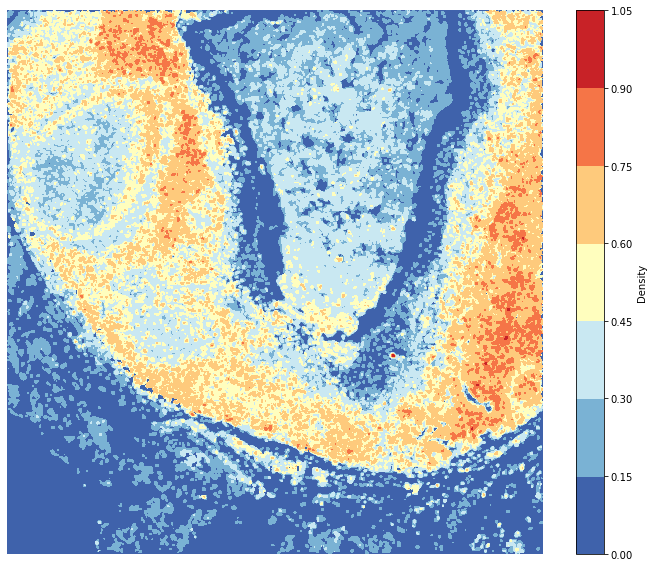

In [51]:
all_mask_n = all_mask/all_mask.max()
fig, ax = plt.subplots(figsize=(12,10))
cp = ax.contourf(X, Y, all_mask_n, cmap='RdYlBu_r', linestyles='-');
fig.gca().invert_yaxis()
cbar = fig.colorbar(cp, extend='both');
cbar.ax.set_ylabel('Density')
ax.axis('off')

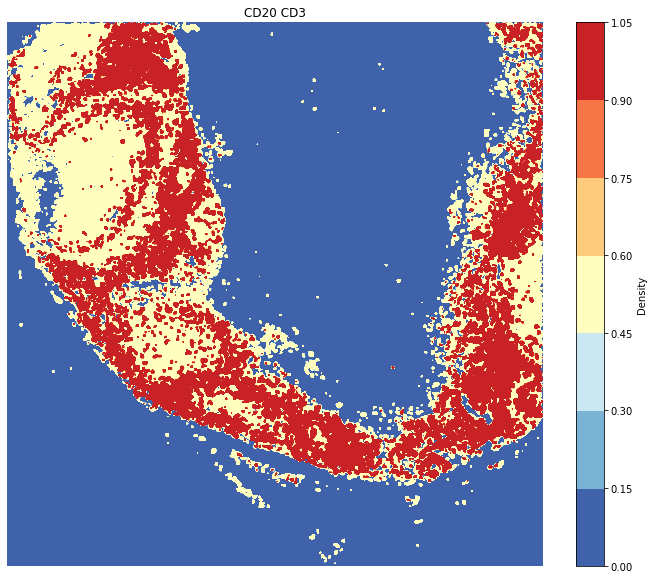

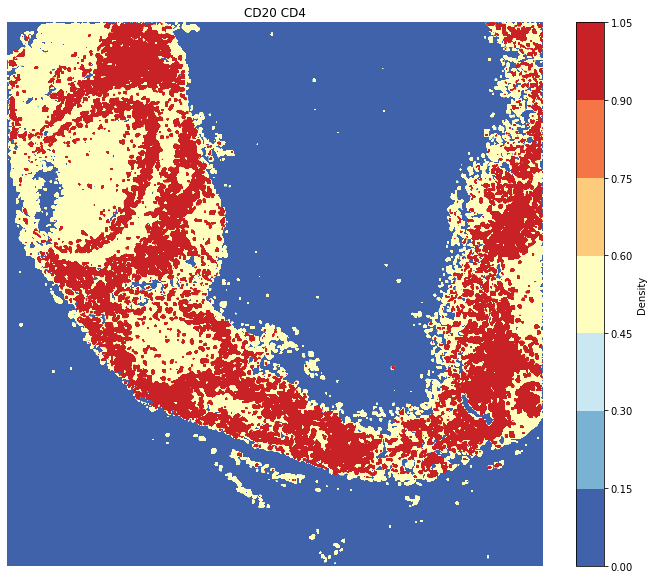

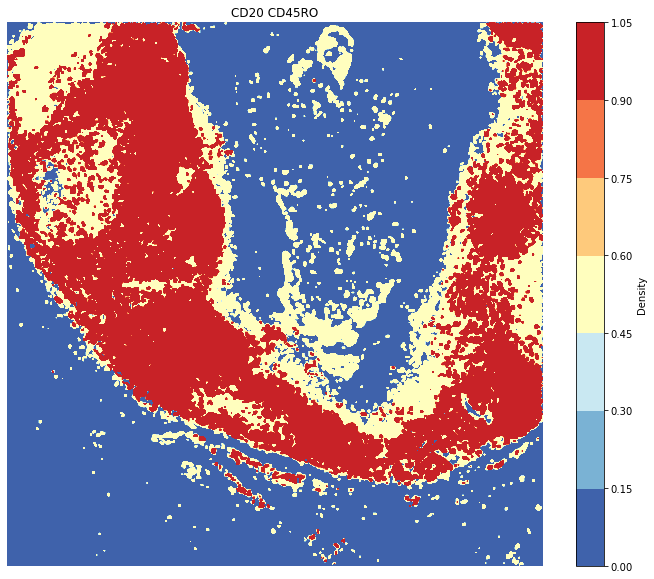

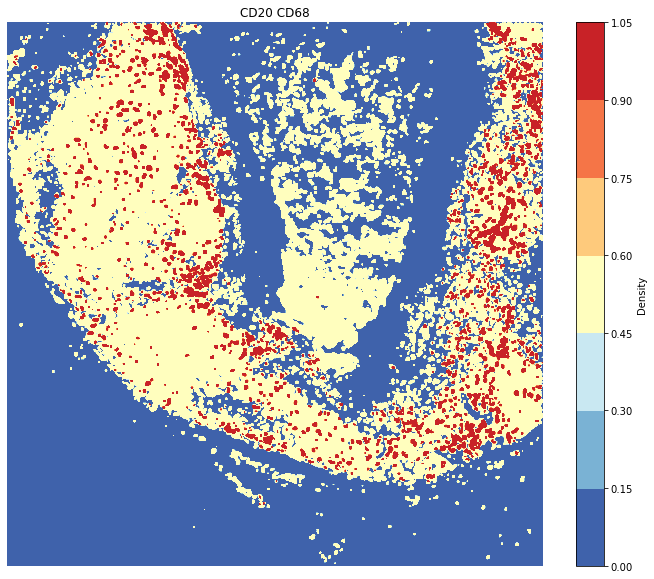

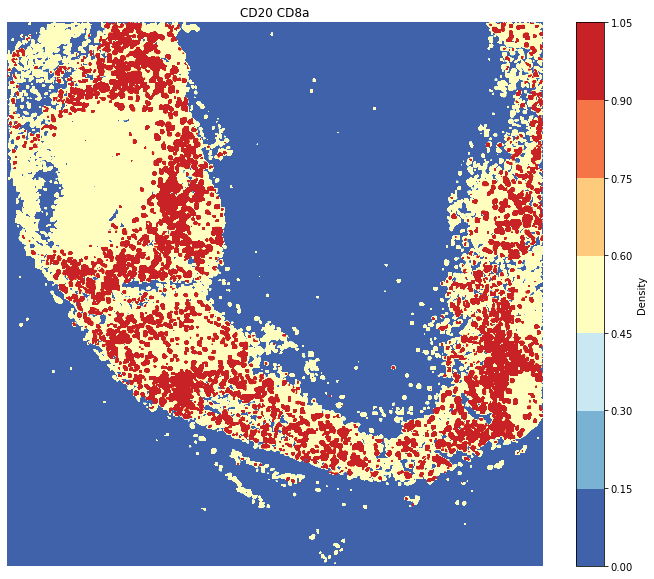

...

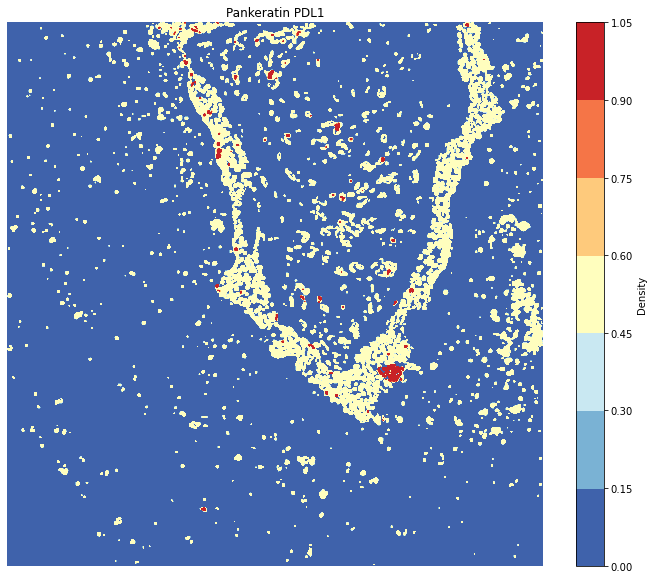

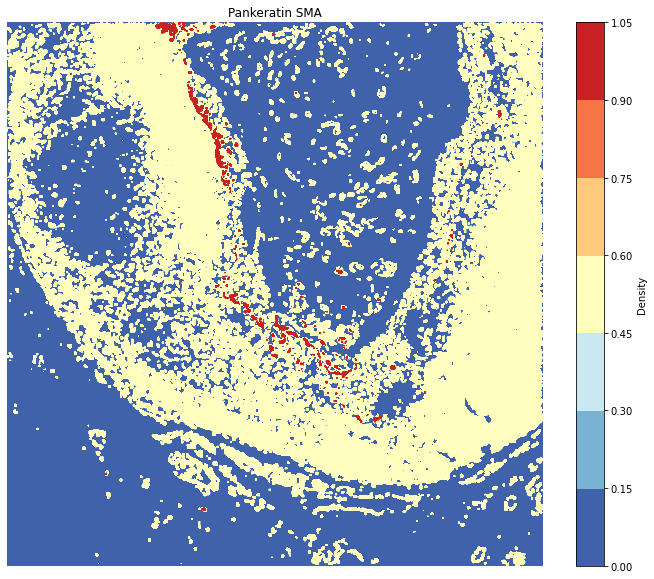

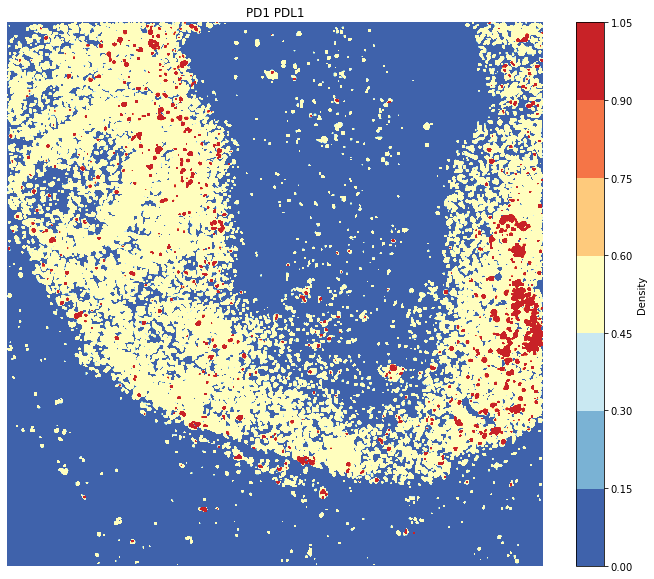

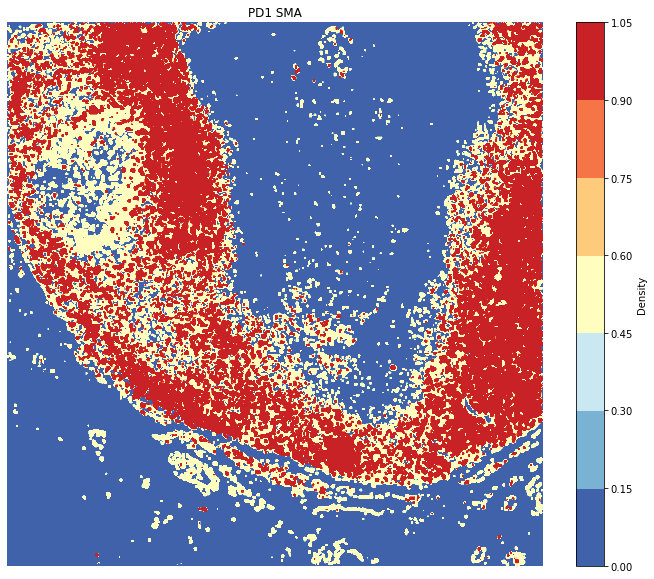

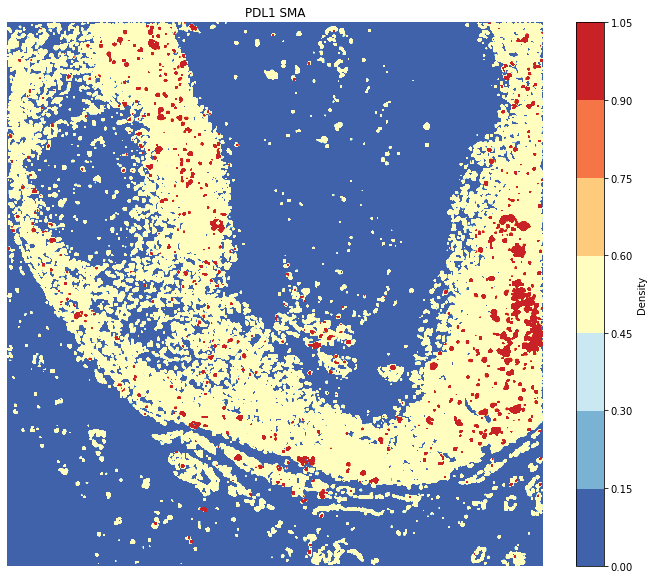

In [59]:
for i in range(len(binary_masks)-1):
    for j in range(i+1,len(binary_masks)-1):
        all_mask = sum([binary_masks[i],binary_masks[j]])
        all_mask_n = all_mask/all_mask.max()
        fig, ax = plt.subplots(figsize=(12,10))
        cp = ax.contourf(X, Y, all_mask_n, cmap='RdYlBu_r', linestyles='-');
        fig.gca().invert_yaxis()
        cbar = fig.colorbar(cp, extend='both');
        cbar.ax.set_ylabel('Density')
        ax.axis('off')
        plt.title(markers[i] + ' ' + markers[j])
        plt.show()